In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from Feature_Extraction import *
from utils import *

import os
from os import listdir
from os.path import isfile, join

from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import MinMaxScaler, StandardScaler

path = os.getcwd() + '/'
path_images = path + 'data/FASSEG-frontal03/'
path_images_perso = path + 'data/perso/'
sub_dir_original = 'Original/'
sub_dir_labeled = 'Labeled/'

/Users/Maxime/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d


# Loading dataset & preprocessing

## Import raw images

Importation of FASSEG dataset images (original images and labeled ones). Some images from the original dataset are removed in case dimensions of images and labels don't match.

In [2]:
dataset_size = 40 # Nb of images to take in dataset
images, raw_labels, names = import_dataset(path_images,sub_dir_original,sub_dir_labeled,dataset_size)

Removed 4 images from dataset, 36 images remaining.


## Extract label

Transformation of labeled color maps (from RGB to 1D).

In [3]:
labels = extract_label(raw_labels)

Extracting labels:

0 / 36
1 / 36
2 / 36
3 / 36
4 / 36
5 / 36
6 / 36
7 / 36
8 / 36
9 / 36
10 / 36
11 / 36
12 / 36
13 / 36
14 / 36
15 / 36
16 / 36
17 / 36
18 / 36
19 / 36
20 / 36
21 / 36
22 / 36
23 / 36
24 / 36
25 / 36
26 / 36
27 / 36
28 / 36
29 / 36
30 / 36
31 / 36
32 / 36
33 / 36
34 / 36
35 / 36
36 / 36


## Dataset visualisation

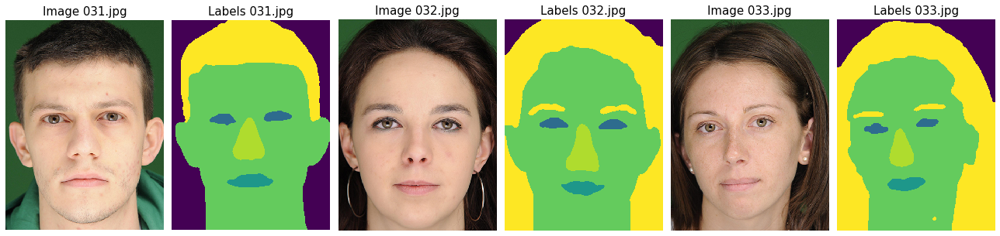

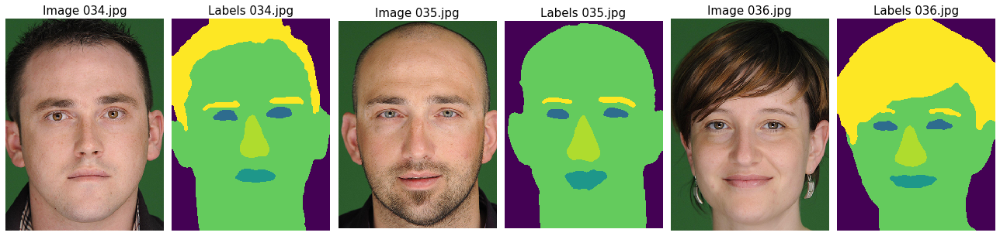

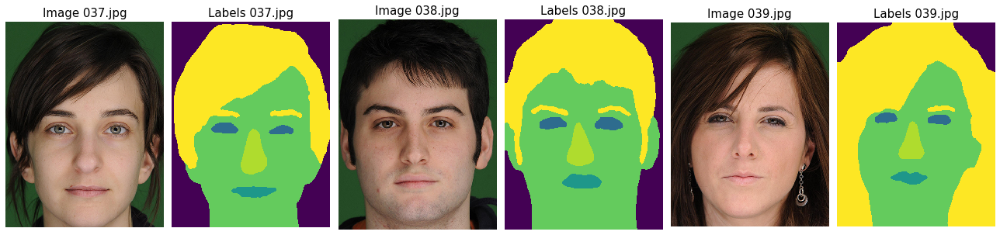

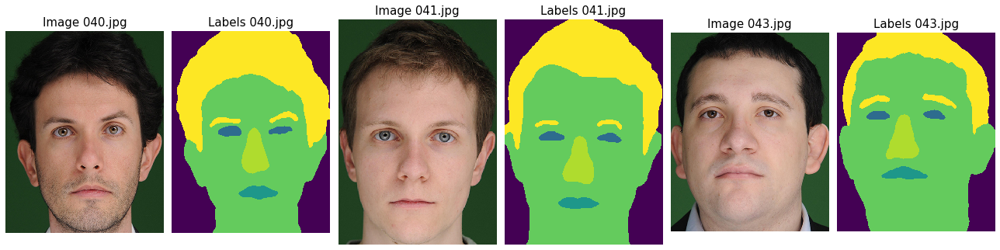

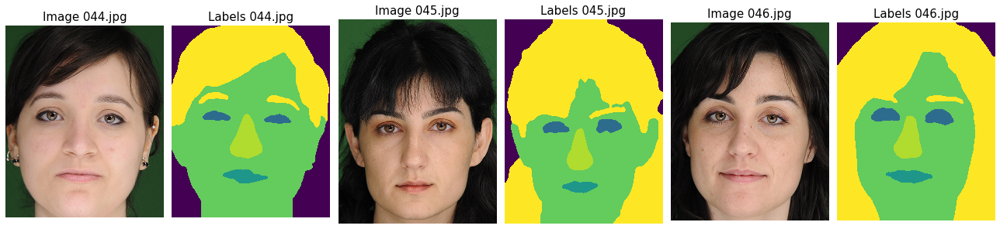

...

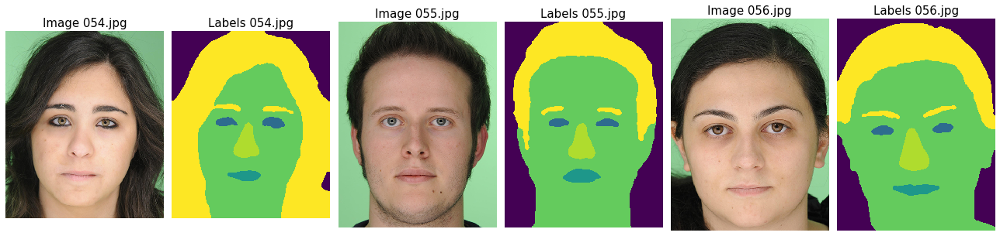

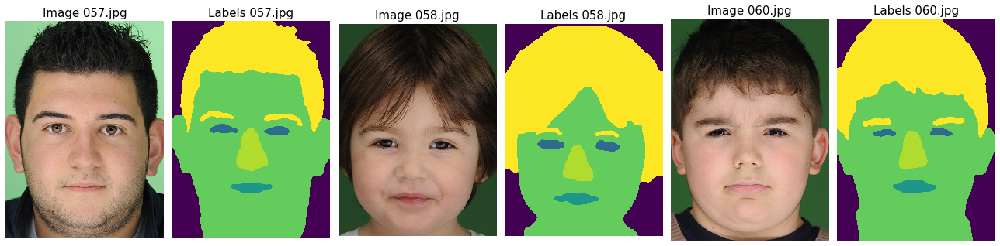

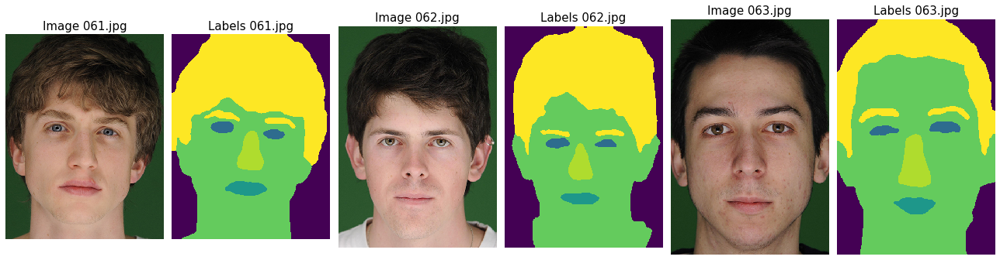

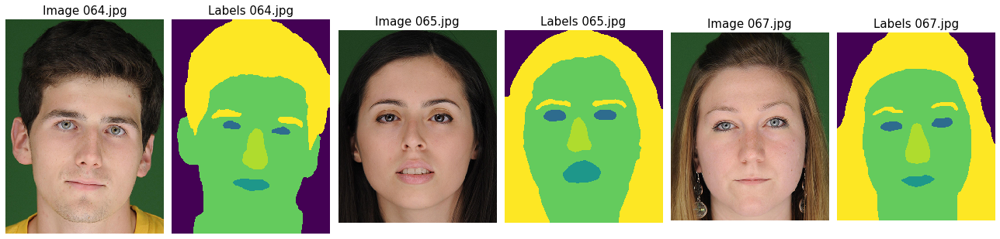

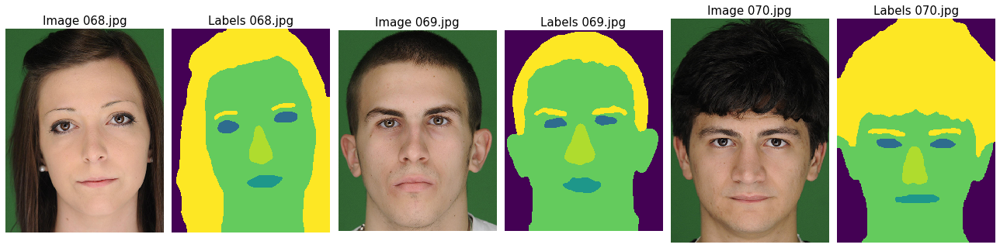

<Figure size 0x360 with 0 Axes>

In [4]:
plot_dataset(images,labels,names)

# Feature extraction

We computed features for each pixel of each image. They can be grouped in different categories :

**No transformation** :

   - Identity : The original image.
   - Dimensions X and Y : Coordinates of each pixel.
   
**Segmentation** :

   - SLIC : Segmentation using K-Means.
   - RandomWalker : Segmentation using a set of markers.
   - Felzenszwalb : Segmentation based on a minimum spanning tree clustering.

**Thresholding** :

   - Otsu : Computing threshold value based on Otsu method.
   - Isodata : Computing threshold value based on Isodata method.
   - Li : Computing threshold value by Li’s iterative Minimum Cross Entropy method.
   - Triangle : Computing threshold value based on the triangle algorithm.
   - Yen : Computing threshold value based on Yen's method.

**Edge detection** :

   - CannyEdge : Edge detection, with canny method.
   - Frangi : Frangi filter, to detect continuous edges.
   - Hessian : Hybrid hessian filter, to detect continuous edges.
   - Laplace : Edge detection, using Laplace operator.
   - Prewitt : Finding edge magnitude with Prewitt transform.
   - Roberts : Finding edge magnitude using Roberts cross operator.
   - Scharr : Finding edge magnitude using the Scharr transform.
   - Sobel : Edge detection using the Sobel filter.
   
**Pooling** :

   - Maximum pooling
   - Minimum pooling
   
**Other** :

   - Gradient magnitude
   - Predictions of Random Forest model trained on HOG and HSV features

## Calculation

In [5]:
# List of features to extract

no_transformation_functions = [Identity, DimensionX, DimensionY]
segmentation_functions = [SLIC2, SLIC4, SLIC20, SLIC40, SLIC60, RandomWalker,
                          FW_200_5, FW_150_5, FW_100_5,FW_150_10, FW_100_10, FW_200_20, FW_150_20,FW_100_20, FW_200_5_UP]
thresholding_functions = [Otsu, Isodata, Li, Triangle, Yen]
pooling_functions = [Max_20, Max_30, Min_20, Min_30, Min_50]
edges_functions = [Frangi, Hessian, Prewitt, Scharr, Sobel]
other_functions = [GradientMagnitude]

not_used = [CannyEdge, ChanVese, PrewittH, PrewittV, RobertsNegDiag, RobertsPosDiag, 
            ScharrH, ScharrV, SobelH, SobelV, Roberts, Laplace, Min_10, Max_10, FW_200_10]

feature_functions = no_transformation_functions + segmentation_functions + thresholding_functions + \
                    edges_functions + pooling_functions + other_functions

In [6]:
X = feature_extraction(images,feature_functions)

Features extracted:

- Identity
- DimensionX
- DimensionY
- SLIC2
- SLIC4
- SLIC20
- SLIC40
- SLIC60
- RandomWalker
- FW_200_5
- FW_150_5
- FW_100_5
- FW_150_10
- FW_100_10
- FW_200_20
- FW_150_20
- FW_100_20
- FW_200_5_UP
- Otsu
- Isodata
- Li
- Triangle
- Yen
- Frangi
- Hessian
- Prewitt
- Scharr
- Sobel
- Max_20
- Max_30
- Min_20
- Min_30
- Min_50
- GradientMagnitude


## Adding HOG & HSV features

In [8]:
X = HOG_HSV(path+'probability_maps_test/',names,X)

## Adding features of neighbors pixels

We add, for each pixel, the features corresponding to its neighbors' features. This will allow the model to get information about a pixel's surroundings, when making a prediction.

## Visualisation

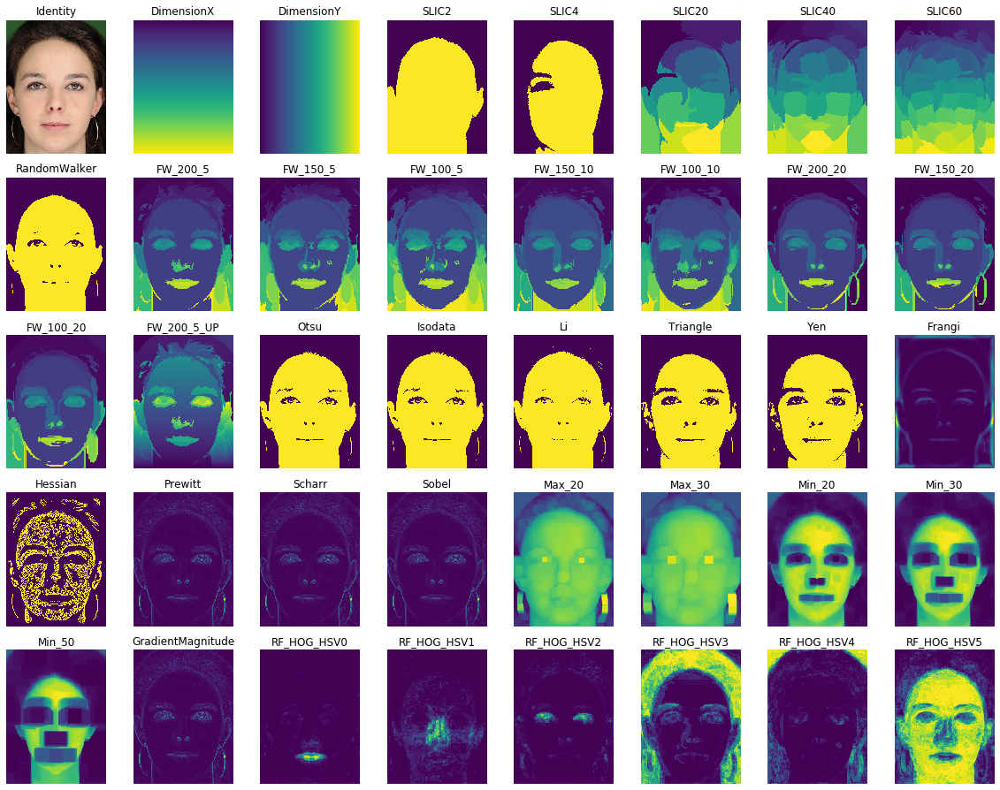

In [9]:
index_viz = 1 # Index of the image whose features will be plotted
plot_features(X, images, index_viz, feature_functions, N_cols=8)

# Target definition

Each pixel is described by a label name among :

   - Background
   - Eyes
   - Mouth
   - Skin
   - Nose
   - Hair

In [10]:
X = target_definition(X,images,labels)

# Face segmentation model

## Train / Test split

We use 80% of images for training and 20% for testing.

In [11]:
X_train, X_test, y_train, y_test, y_train_label, y_test_label, \
train_ids, test_ids, y_train_imageids, y_test_imageids, features = \
train_test_split(X,ratio=0.8)

## Training

In [12]:
model = RandomForestClassifier(n_jobs=-1, max_depth=10, n_estimators=25, criterion='gini')
grid_search = False
params = {'n_estimators' : [10,20],
          'max_depth' : [5,10,20],
          'criterion' : ['gini','entropy'],
          'min_samples_split' : [2]}

model = train(X_train, y_train_label, model, grid_search, params)

## Prediction

In [13]:
y_pred_label = model.predict(X_test)
y_pred_label_train = model.predict(X_train)

print('Accuracy on train set ({} images) : {:.3f}'.format(len(train_ids),accuracy_score(y_train_label,y_pred_label_train)))
print('Accuracy on test set ({} images) : {:.3f}'.format(len(test_ids),accuracy_score(y_test_label,y_pred_label)))

Accuracy on train set (28 images) : 0.945
Accuracy on test set (8 images) : 0.924


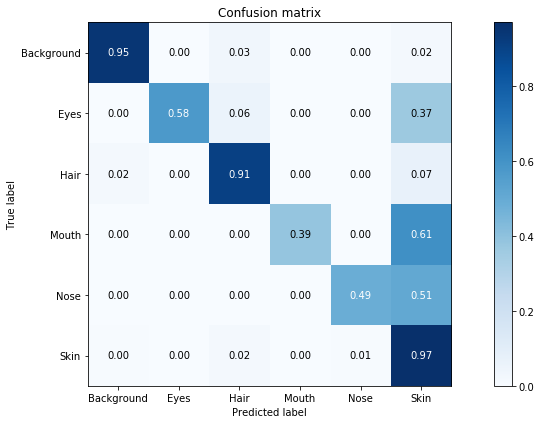

In [14]:
plot_confusion_matrix(model, y_true=y_test_label, y_pred=y_pred_label, normalize=True)

## Visualisation of predictions

The model previously tarined is then used to predict labels for each image in the dataset.

Predictions for images in test set :


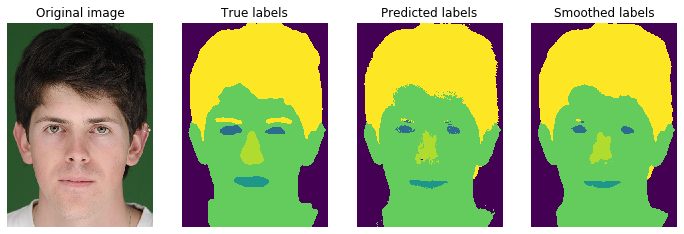

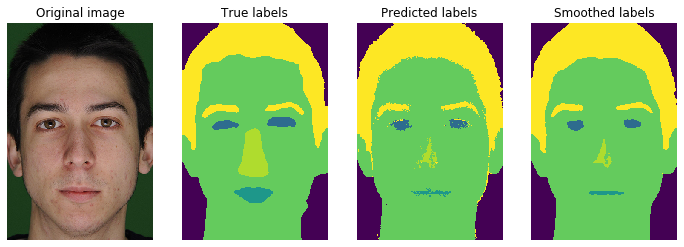

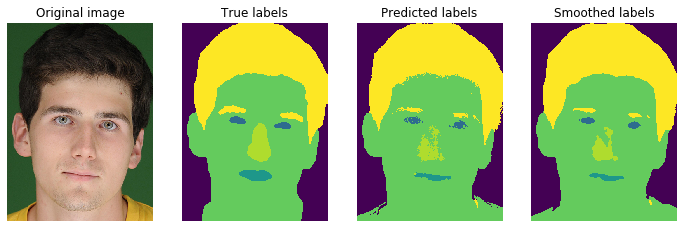

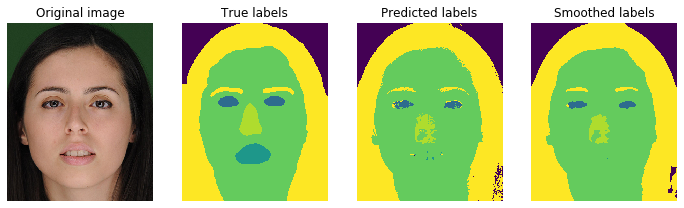

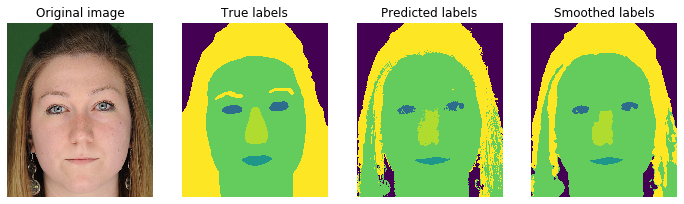

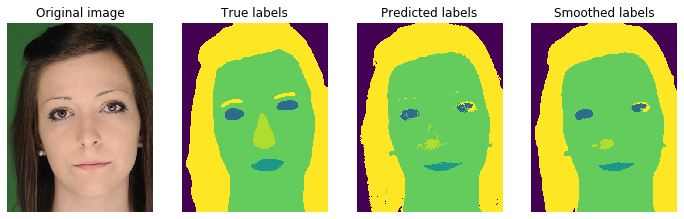

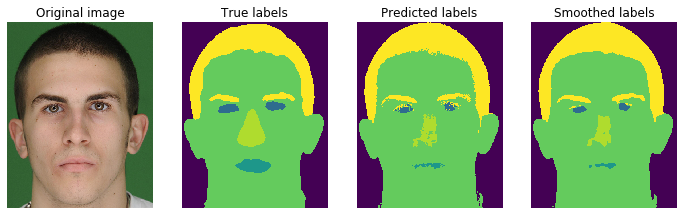

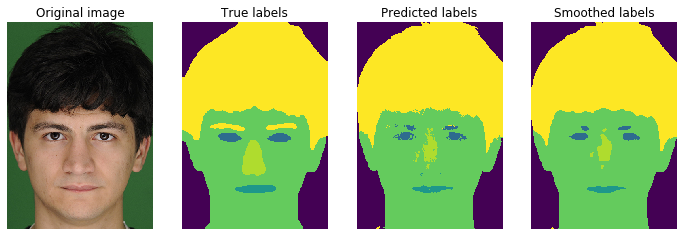

Predictions for images in train set :


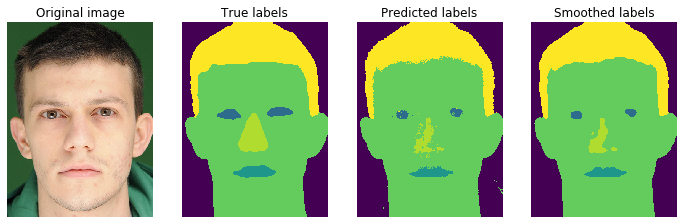

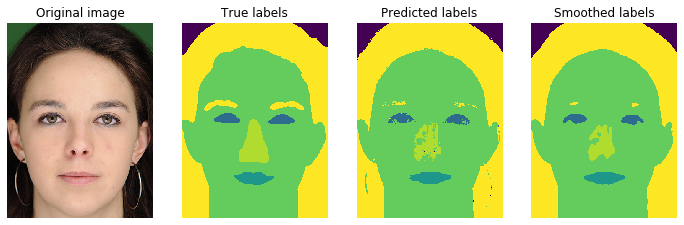

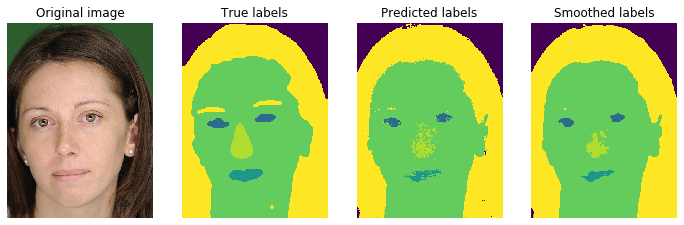

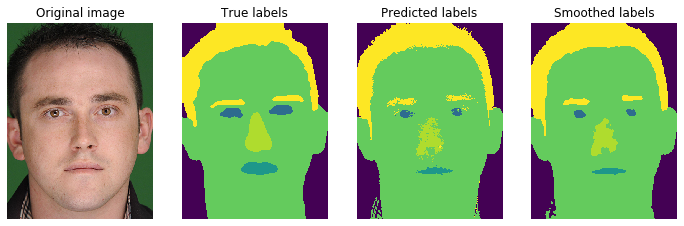

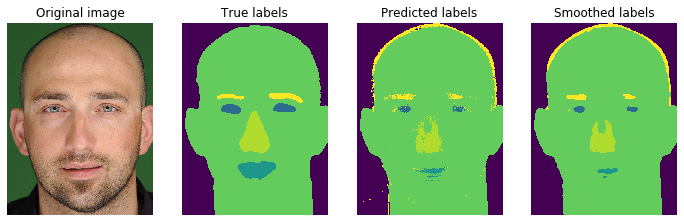

...

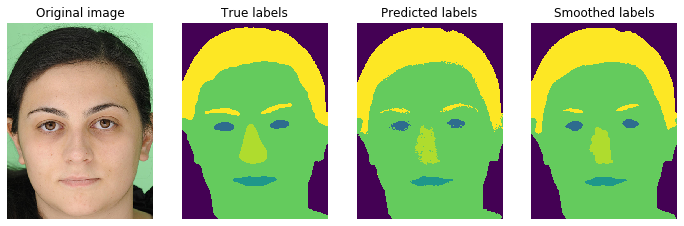

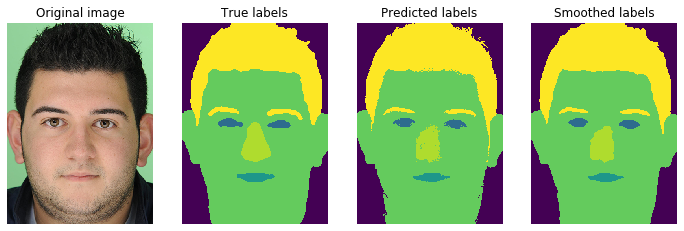

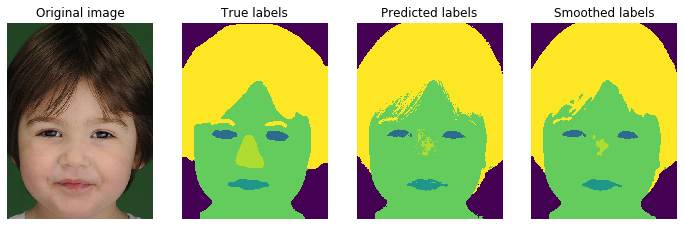

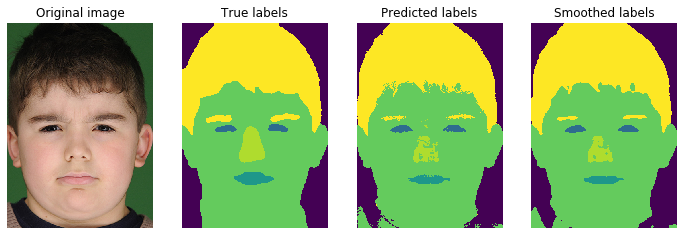

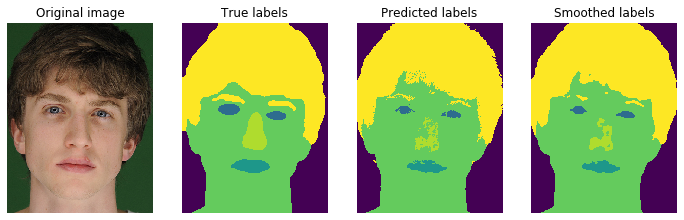

In [15]:
plot_predictions(images, X_train, X_test, y_train, y_test, y_train_label, y_test_label, 
                     y_pred_label_train, y_pred_label, train_ids, test_ids, y_train_imageids, y_test_imageids)

## Feature importance

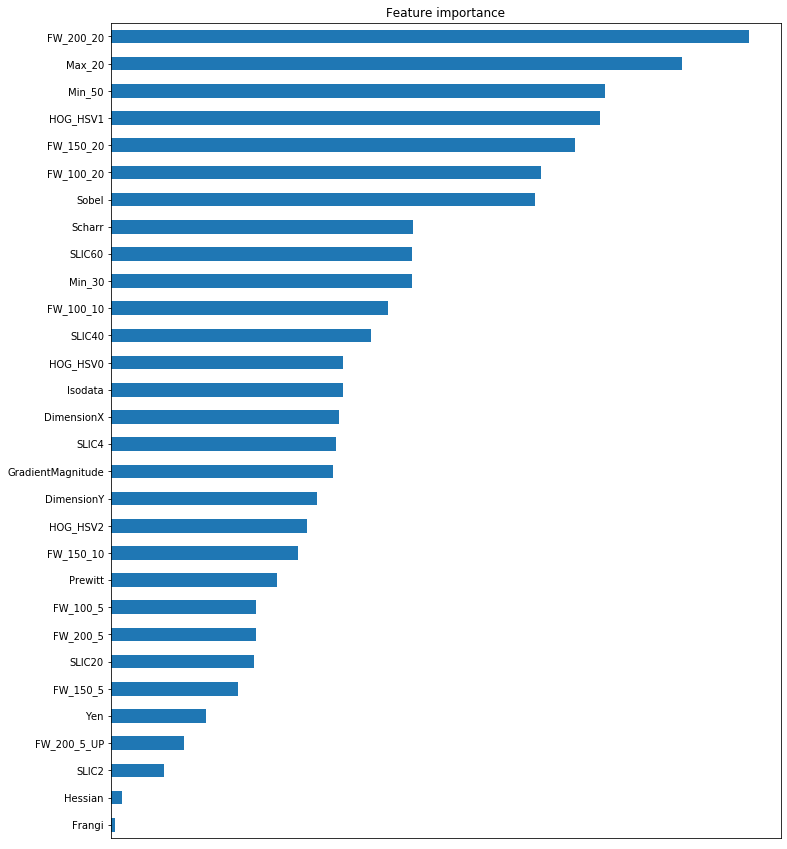

In [16]:
plot_feature_importance(model, features, max_features=30)

# Prediction on new images

## Import raw images

In [18]:
images_perso, names_perso = import_dataset_perso(path_images_perso)

## Dataset visualisation

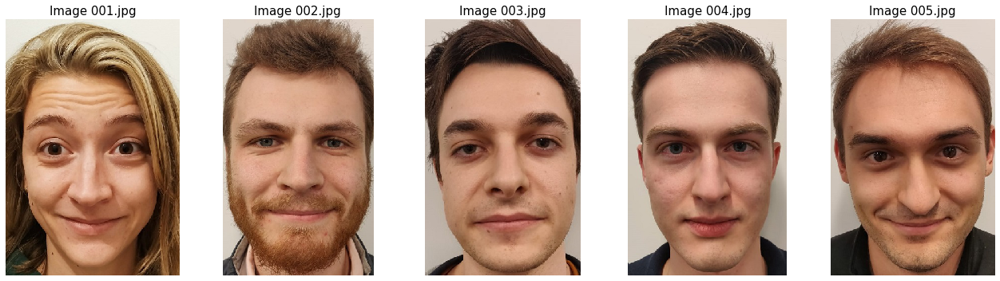

In [19]:
plot_dataset_perso(images_perso,names_perso)

## Feature extraction

In [20]:
X_perso = feature_extraction(images_perso,feature_functions)

Features extracted:

- Identity
- DimensionX
- DimensionY
- SLIC2
- SLIC4
- SLIC20
- SLIC40
- SLIC60
- RandomWalker
- FW_200_5
- FW_150_5
- FW_100_5
- FW_150_10
- FW_100_10
- FW_200_20
- FW_150_20
- FW_100_20
- FW_200_5_UP
- Otsu
- Isodata
- Li
- Triangle
- Yen
- Frangi
- Hessian
- Prewitt
- Scharr
- Sobel
- Max_20
- Max_30
- Min_20
- Min_30
- Min_50
- GradientMagnitude


In [21]:
X_perso = HOG_HSV(path+'probability_maps_perso/',names_perso,X_perso)

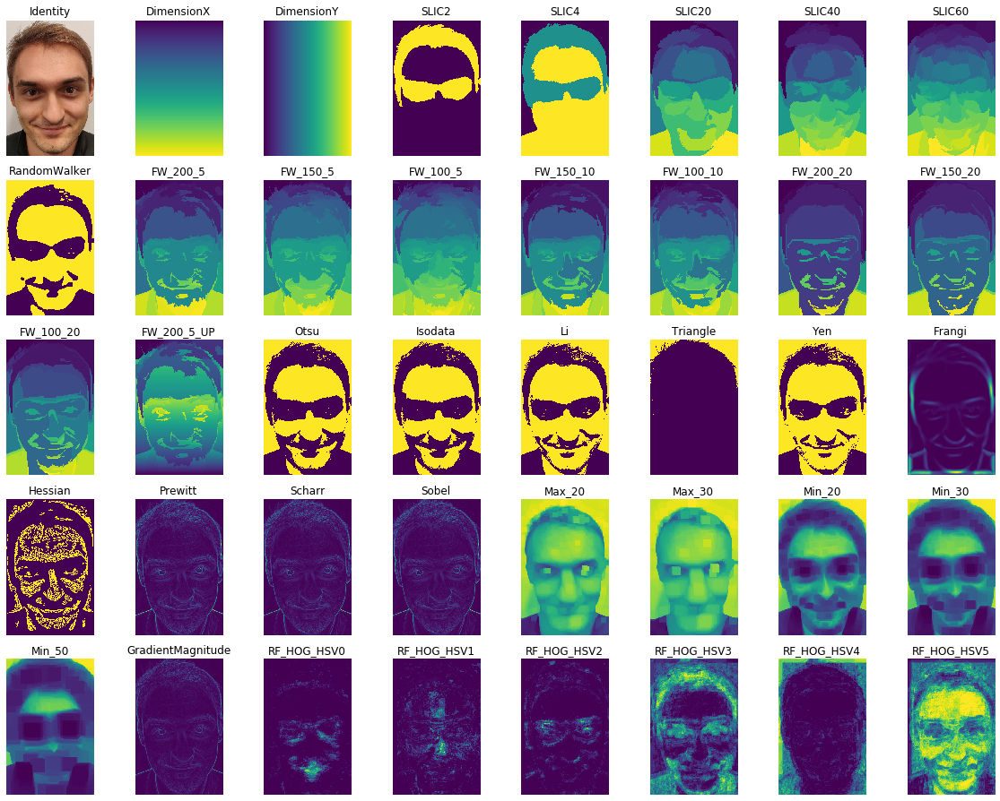

In [26]:
index_viz = 4 # Index of the image whose features will be plotted
plot_features(X_perso, images_perso, index_viz, feature_functions, N_cols=8)

## Prediction

In [23]:
y_pred_label_perso = model.predict(X_perso.drop('ImageId',axis=1))

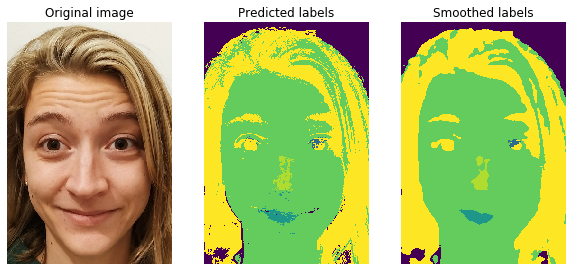

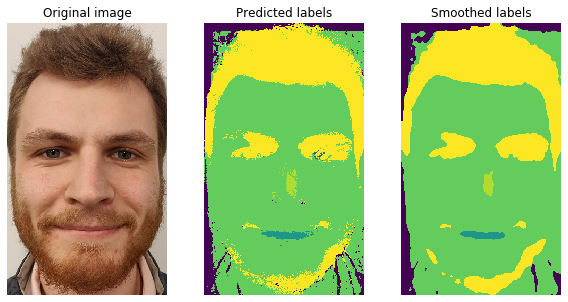

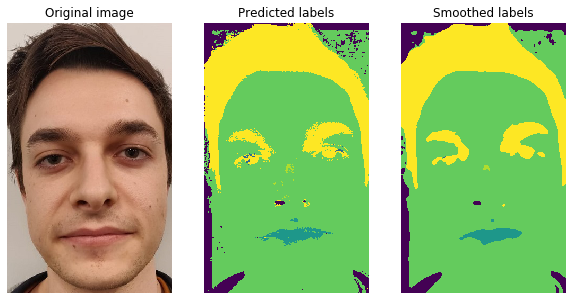

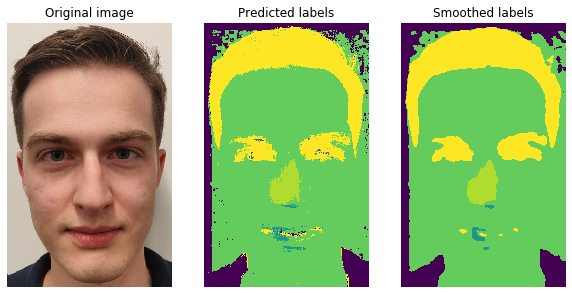

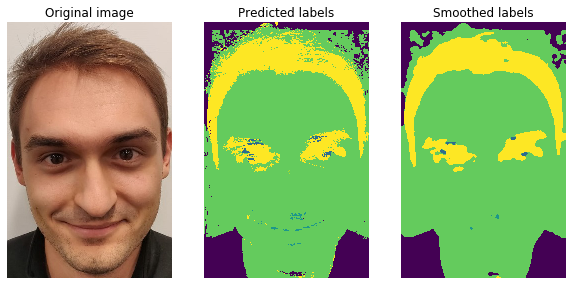

In [24]:
plot_predictions_perso(images_perso, X_perso, y_pred_label_perso)